<a href="https://colab.research.google.com/github/nideez45/Music-Classification-System/blob/main/ML_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
import tensorflow as tf
tf.config.list_physical_devices('GPU')

[]

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import librosa
import librosa.display
import os

In [ ]:
data_path = '/content/drive/MyDrive/musicdata'
data_csv = '/content/drive/MyDrive/new_features.csv'

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics._plot.confusion_matrix import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA

# Extracting features

#List of features used:

1.**MFCC** - Mel-frequency cepstral coefficients. They are derived from cepstral representation of audio clip. MFCCs are commonly used as features in speech recognition systems. It is also used in music information retrieval applications like genre classification.

2.**Chroma_stft** - computes a chromagram from a waveform or power spectrogram.

3.**Spectral** **centroid** - each frame of a magnitude spectrogram is normalized and treated as a distribution over frequency bins, from which the centroid is extracted per frame.

4.**Spectral** **rollof** - it is the frequency below which a specified percentage of the total spectral energy lies.

5.**Tempo** - beats per minute. In clssical music, common temp markings include grave, largo, lento .. etc.

6.**Zero Crossing Rate (zcr)** - it indicates the number of times that a signal crosses the horizontal axis. It is a key feature to classify percussive sounds.

7.**Onset strength** - compute a spectral flux onset strength envelope.

8.**Pitches and Magnitudes** - Pitch tracking on thresholded parabolically interpolated STFT. Pitch is an auditory sensation in which a listener assigns musical tones to relative positions on a musical scale. It is closely related to frequency but no equivalent.

#References:
https://en.wikipedia.org/wiki/Mel-frequency_cepstrum

https://librosa.org/doc/main/feature.html#spectral-features

https://towardsdatascience.com/how-i-understood-what-features-to-consider-while-training-audio-files-eedfb6e9002b

https://musicinformationretrieval.com/

We have used the below code to extract features. It takes more than 15 minutes to run. We have stored the features in a csv and we are using it .

In [ ]:
genres = ['hiphop', 'disco', 'blues', 'pop', 'reggae', 'jazz', 'country', 'metal', 'rock', 'classical']
lst = []
for genre in genres:
  for filename in os.scandir(data_path+'/genres_original/'+ genre):
    print(filename)
    audio_time_series, sr = librosa.load(filename)
    mfcc = librosa.feature.mfcc(audio_time_series, sr=sr)
    hop_length = 5000
    chromagram = librosa.feature.chroma_stft(audio_time_series, sr=sr, hop_length=hop_length)
    spectral_centroids = librosa.feature.spectral_centroid(audio_time_series, sr=sr)
    spectral_rolloff = librosa.feature.spectral_rolloff(audio_time_series, sr=sr)
    tempo, _ = librosa.beat.beat_track(audio_time_series, sr = sr)
    zcr = librosa.feature.zero_crossing_rate(audio_time_series)
    onset_env = librosa.onset.onset_strength(y=audio_time_series, sr=sr)
    pitches, magnitudes = librosa.piptrack(y=audio_time_series, sr=sr)
    flst = [mfcc.mean(1),mfcc.var(1),chromagram.mean(1),chromagram.var(1),spectral_centroids.mean(1),spectral_centroids.var(1),spectral_rolloff.mean(1),spectral_rolloff.var(1),tempo,zcr.mean(1)[0],zcr.var(1)[0],onset_env.mean(0),onset_env.var(0),pitches.mean(1).mean(0),pitches.var(1).var(0)]
    features = np.array([])
    for f in flst:
      features = np.append(features,f)
    lst.append(features)
X = np.array(lst)


In [ ]:
# data frame from csv
DF = pd.read_csv(data_csv).drop('Unnamed: 0',axis=1)
DF = DF[["71","74","66","11","8"]]
DF.head()


,71,74,66,11,8
0,1.508890,1.953445e+10,4662.771160,9.713576,-8.846758
1,2.404655,9.793667e+09,5058.670674,11.844710,-3.739639
2,2.042383,4.343166e+10,5475.312341,11.498654,-16.781036
3,2.341275,8.519285e+09,6047.799109,14.494325,-6.632259
4,1.423120,1.028572e+10,5794.946346,14.009843,-14.718070


Creating Labels

In [ ]:
y = []
for i in range(10):
  for j in range(100):
    y.append(i)
y = np.array(y)

# Data visualization

In [ ]:

print(DF.head())

###Box Plot for BPM

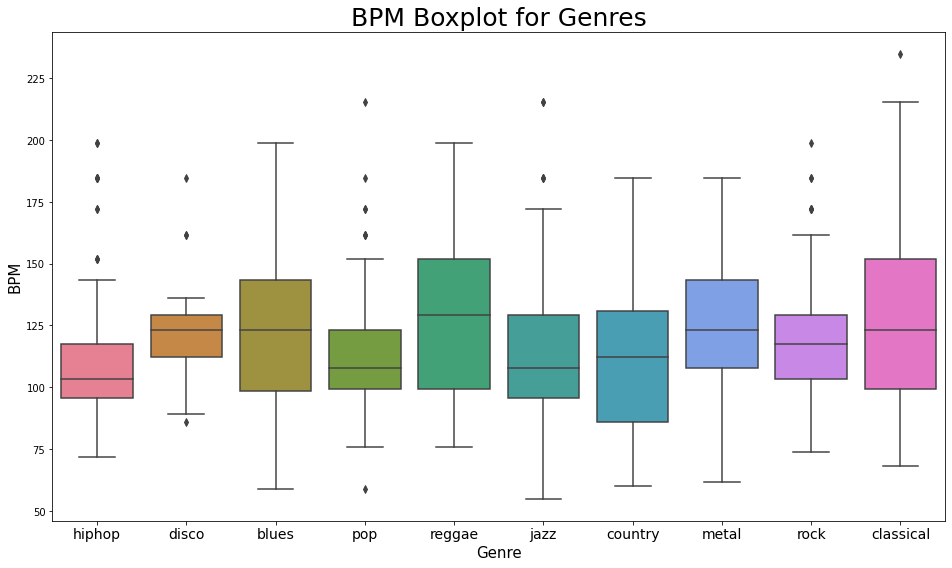

In [ ]:
import seaborn as sns
import copy

Df_cpy = copy.deepcopy(DF)
genres = ['hiphop', 'disco', 'blues', 'pop', 'reggae', 'jazz', 'country', 'metal', 'rock', 'classical']
Df_cpy["labels"] = [genres[lab] for lab in y]
x = Df_cpy[["68", "labels"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "labels", y = "68", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)
plt.savefig("BPM Boxplot.jpg")

Histogram for all features

In [ ]:
DF.hist(color='steelblue', edgecolor='black',grid=False,figsize=(30,30))
plt.plot()

# Distribution of data points

We can observe that the distribution is not skewed

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8aa793fa50>]],
      dtype=object)

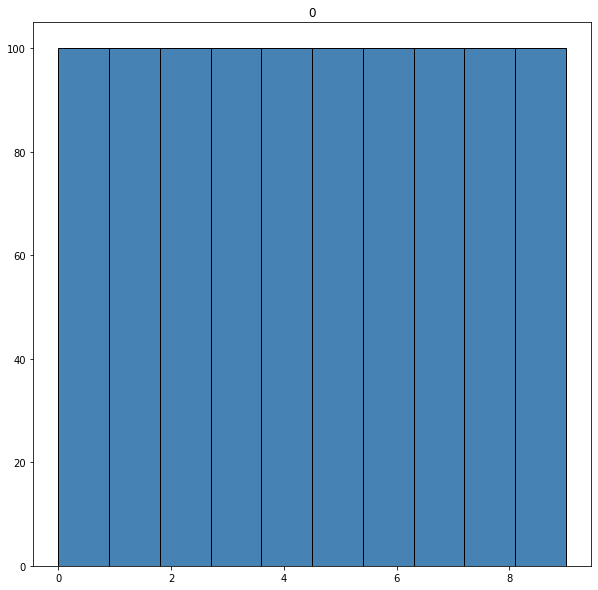

In [ ]:
pd.DataFrame(y).hist(color='steelblue', edgecolor='black',grid=False,figsize=(10,10))

**Principal Component Analysis**

In [ ]:
from sklearn.decomposition import PCA
arrx = []
arry = []
for i in range(25,70,2):
    X_temp = DF.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_train, X_test, y_train, y_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    svm_model = SVC(decision_function_shape="ovo")
    svm_model.fit(X_train, y_train)
    preds = svm_model.predict(X_test)
    arrx.append(i)
    arry.append(accuracy_score(y_test, preds))


In [ ]:
import matplotlib.pyplot as plt
plt.plot(arrx,arry)
print("Best",arrx[np.argmax(arry)])

**Plot for PCA**

In [ ]:
# original data
import plotly.express as px
# real range is 75
print(DF.shape)
feature = [str(i) for i in range(5)]
fig = px.scatter_matrix(
    DF,
    dimensions=feature,
    color = y
)
fig.show()

# Scaling the features with min-max scaler

In [ ]:
X = DF.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X = min_max_scaler.fit_transform(X)

PCA

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=45)
X = pca.fit_transform(X)
#pca.explained_variance_ratio_

In [ ]:
# visualisation after
import plotly.express as px
# real range is 45
df_x = pd.DataFrame(X)
print(df_x.shape)
feature = [i for i in range(5)]
fig = px.scatter_matrix(
    df_x,
    dimensions=feature,
    color = y
)
fig.show()

(1000, 45)


**Visualization after scaling**

# Train Test Split

In [ ]:
X = DF.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X = min_max_scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Data point vs Label plot

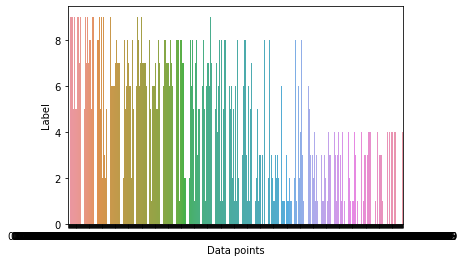

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.barplot(data = pd.DataFrame({'X':X_train[:,0],'y':y_train}),x='X',y='y')
plt.xlabel("Data points")
plt.ylabel("Label")
plt.show()

## Distribution of Train Data

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f535f6d1410>]],
      dtype=object)

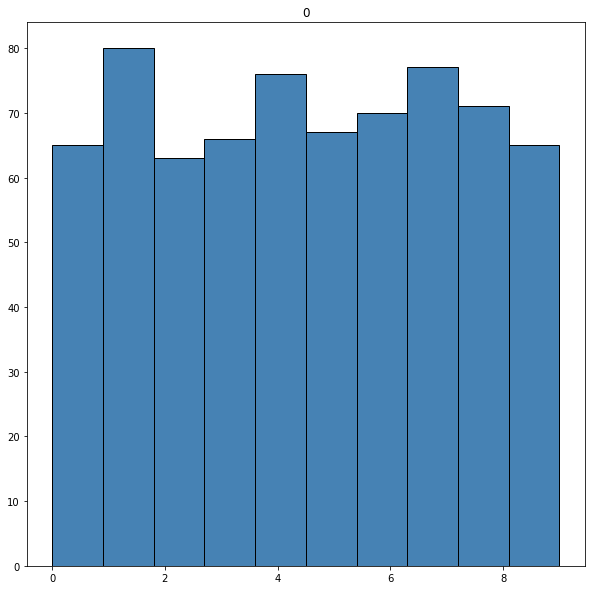

In [ ]:
pd.DataFrame(y_train).hist(color='steelblue', edgecolor='black',grid=False,figsize=(10,10))

## Distribution of Test Data

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f535f6dd050>]],
      dtype=object)

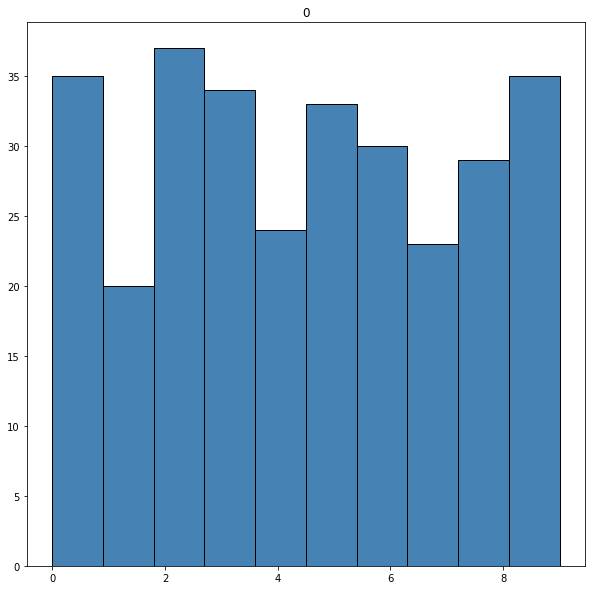

In [ ]:
pd.DataFrame(y_test).hist(color='steelblue', edgecolor='black',grid=False,figsize=(10,10))

Utility function to print confusion matrix

In [ ]:
def DisplayCm(y_test,preds):
  cm = confusion_matrix(y_test,preds)
  disp=ConfusionMatrixDisplay(confusion_matrix=cm)
  disp.plot()

# Linear Discriminant Analysis

In [ ]:
# LDA
lda = LinearDiscriminantAnalysis()
lda.fit_transform(X_train,y_train)
pred = lda.predict(X_test)
print('Accuracy', 'LDA', ':', accuracy_score(y_test, pred), '\n')

Accuracy LDA : 0.46 



# **Classification Models**

# Naive Bayes

Without PCA

Accuracy Naive Bayes : 0.43333333333333335 



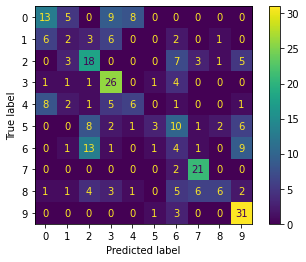

In [ ]:
# Naive Bayes
naivebayes_model = GaussianNB()
naivebayes_model.fit(X_train, y_train)
preds = naivebayes_model.predict(X_test)
print('Accuracy', 'Naive Bayes', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

With PCA

Finding optimal number of components

In [ ]:
arrx = []
arry = []
for i in range(1,5,1):
    X_temp = DF.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    model = GaussianNB()
    model.fit(X_temp_train, y_temp_train)
    preds = model.predict(X_temp_test)
    arrx.append(i)
    arry.append(accuracy_score(y_temp_test, preds))

Best number of components 4


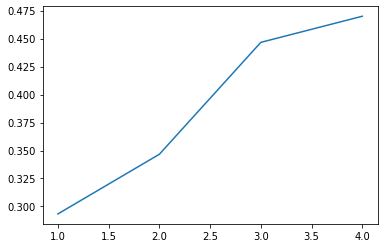

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)])

Accuracy Naive Bayes with PCA : 0.47 



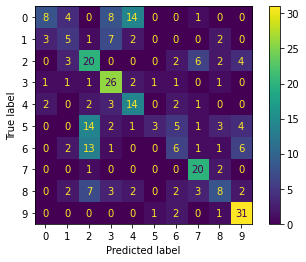

In [ ]:
X_temp = DF.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
model = GaussianNB()
model.fit(X_temp_train, y_temp_train)
preds = model.predict(X_temp_test)
print('Accuracy', 'Naive Bayes with PCA', ':', accuracy_score(y_temp_test, preds), '\n')
DisplayCm(y_test,preds)

In [ ]:
import plotly.express as px
df_x = pd.DataFrame(X)
print(df_x.shape)
feature = [i for i in range(5)]
fig = px.scatter_matrix(
    df_x,
    dimensions=feature,
    color = y
)
fig.show()

(1000, 75)


# KNN

Without PCA

Plotting to choose k

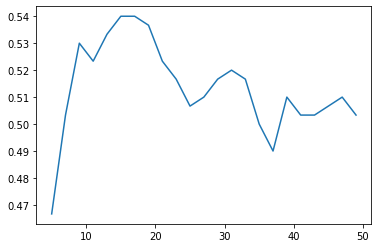

In [ ]:
# KNN
x_k = []
y_acc = []
for k in range(5,50,2):
  knn_model = KNeighborsClassifier(n_neighbors=k)
  knn_model.fit(X_train, y_train)
  preds = knn_model.predict(X_test)
  x_k.append(k)
  y_acc.append(accuracy_score(y_test,preds))

  # print(classification_report(y_test,preds))
plt.plot(x_k,y_acc)

Accuracy KNN : 0.5233333333333333 



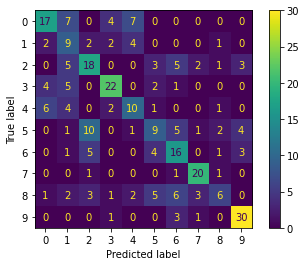

In [ ]:

knn_model = KNeighborsClassifier(n_neighbors=11)
knn_model.fit(X_train, y_train)
preds = knn_model.predict(X_test)
print('Accuracy', 'KNN', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)


With PCA

In [ ]:
arrx = []
arry = []
arrk = []
for i in range(1,5,1):
    X_temp = DF.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    x_k = []
    y_acc = []
    for k in range(5,50,1):
      model = KNeighborsClassifier(n_neighbors=k)
      model.fit(X_temp_train, y_temp_train)
      preds = model.predict(X_temp_test)
      x_k.append(k)
      y_acc.append(accuracy_score(y_temp_test,preds))
    arrx.append(i)
    arrk.append(x_k[np.argmax(y_acc)])
    arry.append(y_acc[np.argmax(y_acc)])

Best number of components 4 , k is 16


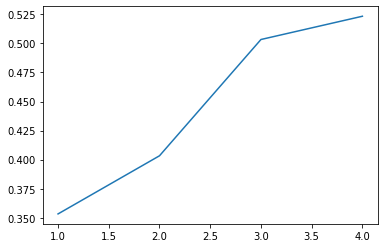

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
bestk = arrk[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)],", k is",arrk[np.argmax(arry)])

Accuracy KNN with PCA : 0.49666666666666665 



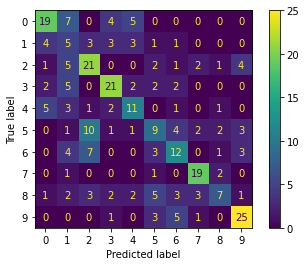

In [ ]:
X_temp = DF.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
x_k = []
y_acc = []
model = KNeighborsClassifier(n_neighbors=7)
model.fit(X_temp_train, y_temp_train)
preds = model.predict(X_temp_test)
print('Accuracy', 'KNN with PCA', ':', accuracy_score(y_temp_test, preds), '\n')
DisplayCm(y_test,preds)

# Decision Trees

Without PCA

Accuracy Decision Tree : 0.44333333333333336 



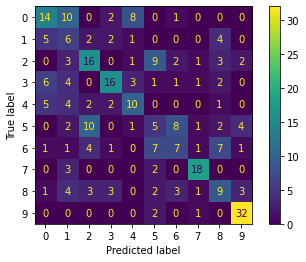

In [ ]:
# Decission trees
decisiontree_model = DecisionTreeClassifier()
decisiontree_model.fit(X_train, y_train)
preds = decisiontree_model.predict(X_test)
print('Accuracy', 'Decision Tree', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

**Image of decision tree**

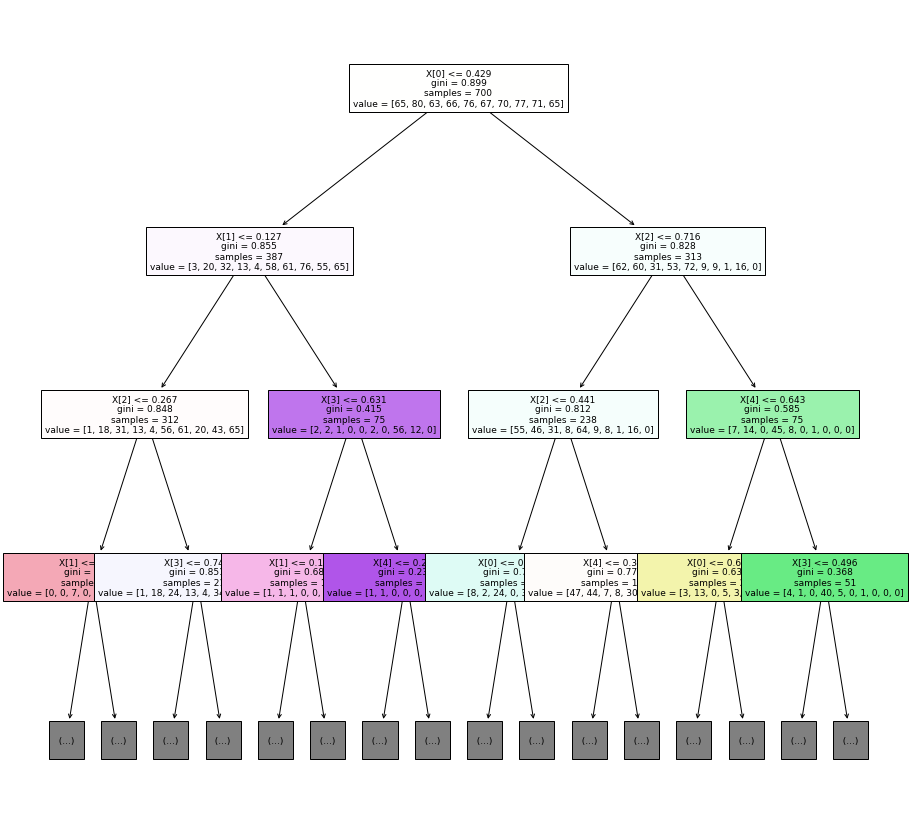

In [ ]:
# sklearn.tree.plot_tree(decisiontree_model,max_depth = 3,fontsize = 9)
plt.figure(figsize=(15, 15)) # Resize figure
sklearn.tree.plot_tree(decisiontree_model,max_depth = 3,fontsize = 9, filled=True)
plt.show()

With PCA

In [ ]:
arrx = []
arry = []
for i in range(1,5,1):
    X_temp = DF.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    model = DecisionTreeClassifier()
    model.fit(X_temp_train, y_temp_train)
    preds = model.predict(X_temp_test)
    arrx.append(i)
    arry.append(accuracy_score(y_temp_test, preds))

Best number of components 4


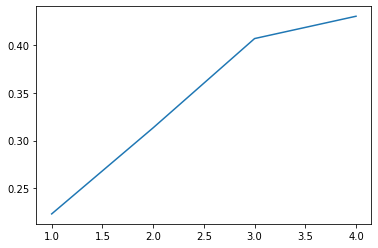

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)])

Accuracy Decision Tree : 0.43333333333333335 



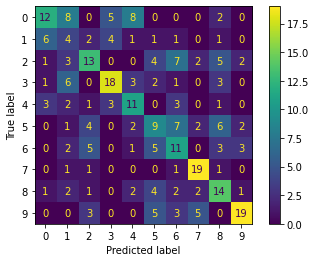

In [ ]:
X_temp = DF.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
model = DecisionTreeClassifier()
model.fit(X_temp_train, y_temp_train)
preds = model.predict(X_temp_test)
print('Accuracy', 'Decision Tree', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

**Plotting Image of Decision Tree**

In [ ]:
plt.figure(figsize=(15, 15)) # Resize figure
sklearn.tree.plot_tree(decisiontree_model,max_depth = 3,fontsize = 9, filled=True)
plt.show()

# Random Forest

Accuracy Random Forest : 0.7133333333333334 



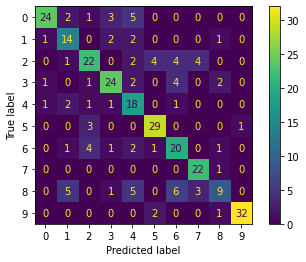

In [ ]:
# Random Forest
randomforest_model = RandomForestClassifier(n_estimators=10000, max_depth=7, random_state=42)
randomforest_model.fit(X_train, y_train)
preds = randomforest_model.predict(X_test)
print('Accuracy', 'Random Forest before PCA', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

Feature importance

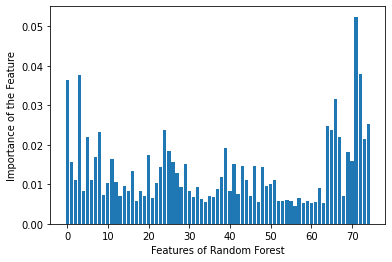

In [ ]:
importance = randomforest_model.feature_importances_
plt.bar([x for x in range(len(importance))], importance)
plt.xlabel("Features of Random Forest")
plt.ylabel("Importance of the Feature")
plt.show()

with PCA

In [ ]:
arrx = []
arry = []
for i in range(1,76,2):
    X_temp = DF.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    model = RandomForestClassifier(n_estimators=10000, max_depth=7, random_state=42)
    model.fit(X_temp_train, y_temp_train)
    preds = model.predict(X_temp_test)
    arrx.append(i)
    arry.append(accuracy_score(y_temp_test, preds))

Best number of components 41


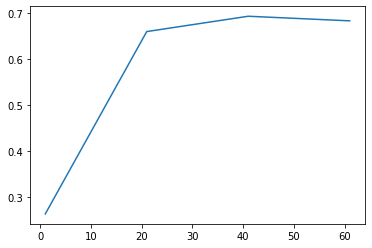

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)])

Accuracy Random Forest after PCA  : 0.7 



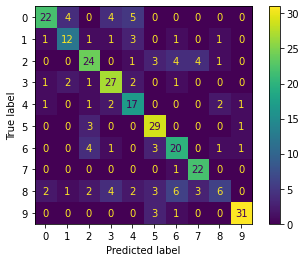

In [ ]:
X_temp = DF.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
model = RandomForestClassifier(n_estimators=10000, max_depth=7, random_state=42)
model.fit(X_temp_train, y_temp_train)
preds = model.predict(X_temp_test)
print('Accuracy', 'Random Forest after PCA ', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

# Support Vector Machine

Without PCA

Accuracy SVM : 0.6966666666666667 



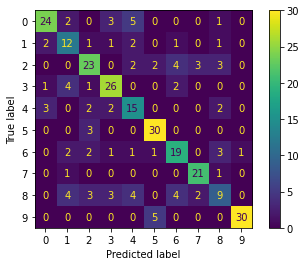

In [ ]:
from sklearn.svm import LinearSVC
# Support Vector Machine
svm_model = SVC(decision_function_shape="ovo")
svm_model.fit(X_train, y_train)
preds = svm_model.predict(X_test)
print('Accuracy', 'SVM', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)


In [ ]:
# plotting importance of SVM features
# from sklearn.feature_extraction.text import CountVectorizer
# from sklearn.svm import LinearSVC
# import matplotlib.pyplot as pltdef
# def plot_coefficients(classifier, feature_names, top_features=20):
#   coef = classifier.coef_.ravel()
#   top_positive_coefficients = np.argsort(coef)[-top_features:]
#   top_negative_coefficients = np.argsort(coef)[:top_features]
#   top_coefficients = np.hstack([top_negative_coefficients, top_positive_coefficients])
#   # create plot
#   plt.figure(figsize=(15, 5))
#   colors = ['red' if c < 0 else 'blue' for c in coef[top_coefficients]]
#   plt.bar(np.arange(2 * top_features), coef[top_coefficients], color=colors)
#   feature_names = np.array(feature_names)
#   plt.xticks(np.arange(1, 1 + 2 * top_features), feature_names[top_coefficients], rotation=60, ha='right')
#   plt.show()
# cv = CountVectorizer()
# cv.fit(df)
# X_training = cv.transform(df)
# plot_coefficients(svm_model, cv.get_feature_names())

With PCA

In [ ]:
arrx = []
arry = []
for i in range(1,76,1):
    X_temp = DF.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    model = SVC(decision_function_shape="ovo")
    model.fit(X_temp_train, y_temp_train)
    preds = model.predict(X_temp_test)
    arrx.append(i)
    arry.append(accuracy_score(y_temp_test, preds))

Best number of components 53


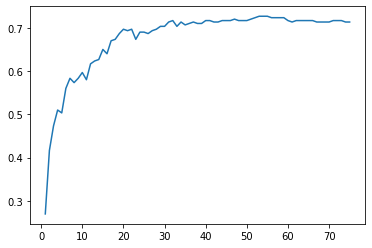

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)])

Accuracy SVM : 0.7266666666666667 



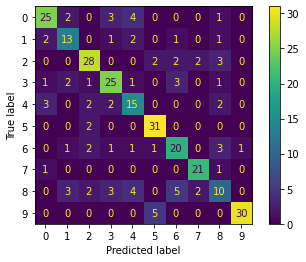

In [ ]:
X_temp = DF.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
svm_model = SVC(decision_function_shape="ovo")
svm_model.fit(X_temp_train, y_temp_train)
preds = svm_model.predict(X_temp_test)
print('Accuracy', 'SVM', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)


In [ ]:
U = pca.components_
print(U.shape)

(53, 75)


# Logistic Regression

Without PCA

Accuracy Logistic Regression : 0.6733333333333333 



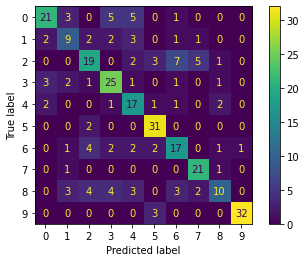

In [ ]:
# Logistic Regression
logistic_model = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial',max_iter = 100000)
logistic_model.fit(X_train, y_train)
preds = logistic_model.predict(X_test)
print('Accuracy', 'Logistic Regression', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

Feature importance

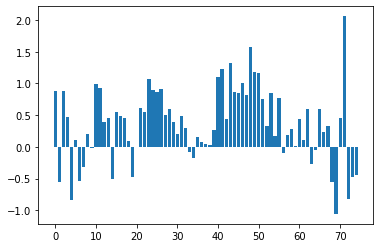

In [ ]:
import math
importance = logistic_model.coef_[0]
plt.bar([x for x in range(len(importance))], (importance))
plt.show()

With PCA

In [ ]:
arrx = []
arry = []
for i in range(1,76,1):
    X_temp = DF.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    model =LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial',max_iter = 100000)
    model.fit(X_temp_train, y_temp_train)
    preds = model.predict(X_temp_test)
    arrx.append(i)
    arry.append(accuracy_score(y_temp_test, preds))

Best number of components 49


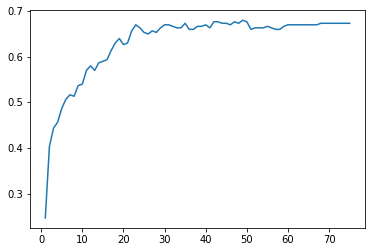

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)])

Accuracy Logistic Regression : 0.6766666666666666 



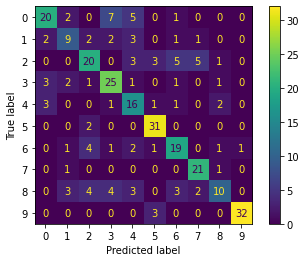

In [ ]:
X_temp = DF.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
model =LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial',max_iter = 100000)
model.fit(X_temp_train, y_temp_train)
preds = model.predict(X_temp_test)
print('Accuracy', 'Logistic Regression', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

#XG Boost

In [ ]:
xgboost_model = XGBClassifier(n_estimators=1000, learning_rate=0.05)
xgboost_model.fit(X_train, y_train)
preds = xgboost_model.predict(X_test)
print('Accuracy', 'Cross Gradient Boost', ':', accuracy_score(y_test, preds), '\n')

Accuracy Cross Gradient Boost : 0.7233333333333334 



# Random Forest with RandomizedSearchCV

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
random_grid = { 'n_estimators' : [1000,1500,2000], 'max_features' : ['sqrt','log2',None], 'max_depth' : [10,30,20],'min_samples_split' : [5,10,15] ,'min_samples_leaf' : [1,5,10], 'bootstrap' : [True,False]}
rfc = RandomForestClassifier()
rcv = RandomizedSearchCV(rfc, param_distributions = random_grid)
rcv.fit(X_train,y_train)

In [ ]:
best_params_rf = rcv.best_params_
print(best_params_rf)

In [ ]:
tuned_random_forest_model =RandomForestClassifier(n_estimators=best_params_rf['n_estimators'],max_features=best_params_rf['max_features'],max_depth=best_params_rf['max_depth'],min_samples_split = best_params_rf['min_samples_split'],min_samples_leaf=best_params_rf['min_samples_leaf'],bootstrap=best_params_rf['bootstrap'])
tuned_random_forest_model.fit(X_train,y_train)
preds = tuned_random_forest_model.predict(X_test)
print('Accuracy', 'Random Forest with grid search', ':', accuracy_score(y_test, preds), '\n')

importance = tuned_random_forest_model.feature_importances_
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
plt.xlabel("Features of Tuned Random Forest")
plt.ylabel("Importance of the Features")
plt.bar([x for x in range(len(importance))], importance)
plt.show()

# SVM with hyper-parameter tuning

In [ ]:
from sklearn import svm
param_grid = {'kernel':['linear','poly','rbf'],'C':[1e-3,1e-2,1e-1,1,5,10],'gamma':['scale','auto'],'degree':[2,3,4,5,10]}

In [ ]:
from sklearn.model_selection import GridSearchCV
svc = svm.SVC()
clf = GridSearchCV(svc, param_grid)
clf.fit(X_train,y_train)


In [ ]:
final_model = svm.SVC(C = 0.1,degree = 4,gamma = 'scale',kernel = 'poly')
final_model.fit(X_train,y_train)

In [ ]:
from sklearn.metrics import classification_report
y_true = y_test
y_pred = final_model.predict(X_test)
print("Classification Report")
print(classification_report(y_true,y_pred))

# Pre-Trained model

In [ ]:
import os
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from keras.models import Model
import numpy as np
import tensorflow

In [ ]:
base_model = VGG16(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('flatten').output)


553467096/553467096 [==============================] - 11s 0us/step


In [ ]:
def get_features(img_path):
    img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
    x = tf.keras.utils.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    flatten = model.predict(x)
    return list(flatten[0])

**Feature extraction from pre trained model**

We are using pre trained vgg16 model and extracting features from spectogram of the audios. The below feature extraction takes more than 10 minutes. We have stored the features as a csv file.

In [ ]:
genres = ['hiphop', 'disco', 'blues', 'pop', 'reggae', 'jazz', 'country', 'metal', 'rock', 'classical']
lst1 = []
gg = []
for genre in genres:
  count = 0
  for filename in os.scandir(data_path+'/images_original/'+ genre):
    count+=1
    features = get_features(filename.path)
    lst1.append(features)
  gg.append(count)


In [ ]:
# df = pd.DataFrame(lst1)
# print(df.shape)
# df.to_csv("/content/drive/MyDrive/pretrained_features.csv")


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/pretrained_features.csv").drop('Unnamed: 0',axis=1)
print(df.shape)

(1000, 25088)


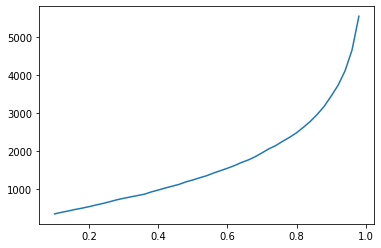

In [ ]:
df = df.loc[:, (df != 0).any(axis=0)]
# remove more than p percent zeros column
x = []
y = []
for p in range(10,100,2):
    p/=100
    new_df = df.loc[:, (df==0).mean() < p]
    x.append(p)
    y.append(new_df.shape[1])
plt.plot(x,y)

In [ ]:
df = df.loc[:, (df==0).mean() < 0.8]

# Scaling the features

In [ ]:
from sklearn.preprocessing import StandardScaler
X_pre = df.to_numpy()

min_max_scaler = preprocessing.MinMaxScaler()
X_pre = min_max_scaler.fit_transform(X_pre)
print("Shape of data")
print(X_pre.shape)

Shape of data
(1000, 2484)


Creating labels

In [ ]:
y = []
for i in range(10):
  for j in range(100):
    y.append(i)
y = np.array(y)

**Test Train Split**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_pre, y, test_size=0.3, random_state=42)

# Classification Models

without pca

Accuracy SVM : 0.65 



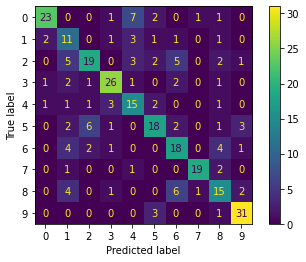

In [ ]:
# Support Vector Machine
svm_model = SVC(decision_function_shape="ovo")
svm_model.fit(X_train, y_train)
preds = svm_model.predict(X_test)
print('Accuracy', 'SVM', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

with pca

In [ ]:
arrx = []
arry = []
for i in range(1,76,1):
    X_temp = df.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    model = SVC(decision_function_shape="ovo")
    model.fit(X_temp_train, y_temp_train)
    preds = model.predict(X_temp_test)
    arrx.append(i)
    arry.append(accuracy_score(y_temp_test, preds))


Best number of components 60


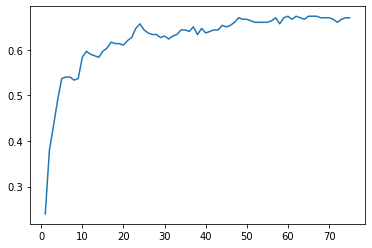

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)])

Accuracy SVM : 0.6633333333333333 



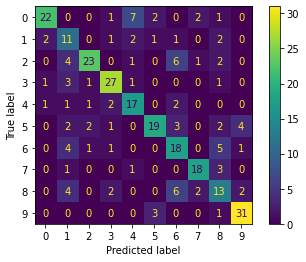

In [ ]:
X_temp = df.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
svm_model = SVC(decision_function_shape="ovo")
svm_model.fit(X_temp_train, y_temp_train)
preds = svm_model.predict(X_temp_test)
print('Accuracy', 'SVM', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

SVM Hyper parameter tuning

In [ ]:
from sklearn import svm
param_grid = {'kernel':['linear','poly','rbf'],'C':[1e-5,1e-3,1e-1,1],'gamma':['scale','auto'],'degree':[2,3,4]}

In [ ]:
from sklearn.model_selection import GridSearchCV
svc = svm.SVC()
clf = GridSearchCV(svc, param_grid)
clf.fit(X_train,y_train)


In [ ]:
#clf.best_params_
final_model = svm.SVC(C = 5,degree = 2,gamma = 'scale',kernel = 'rbf')
final_model.fit(X_train,y_train)

In [ ]:
from sklearn.metrics import classification_report
y_true = y_test
y_pred = final_model.predict(X_test)
print("Classification Report")
print(classification_report(y_true,y_pred))

**Naive Bayes**

without pca

Accuracy Naive Bayes : 0.54 



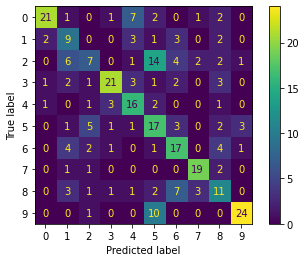

In [ ]:
# Naive Bayes
naivebayes_model = GaussianNB()
naivebayes_model.fit(X_train, y_train)
preds = naivebayes_model.predict(X_test)
print('Accuracy', 'Naive Bayes', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

with pca

In [ ]:
arrx = []
arry = []
for i in range(1,76,4):
    X_temp = df.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    model = GaussianNB()
    model.fit(X_temp_train, y_temp_train)
    preds = model.predict(X_temp_test)
    arrx.append(i)
    arry.append(accuracy_score(y_temp_test, preds))

Best number of components 29


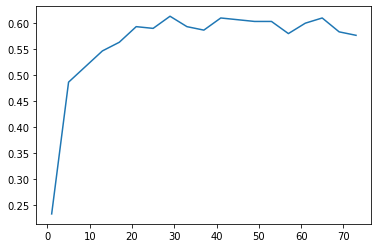

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)])

Accuracy Naive Bayes with PCA : 0.6133333333333333 



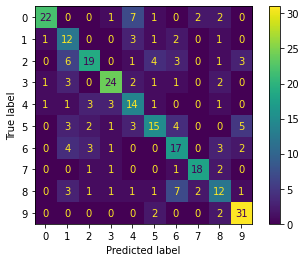

In [ ]:
X_temp = df.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
model = GaussianNB()
model.fit(X_temp_train, y_temp_train)
preds = model.predict(X_temp_test)
print('Accuracy', 'Naive Bayes with PCA', ':', accuracy_score(y_temp_test, preds), '\n')
DisplayCm(y_test,preds)

**KNN**

without pca


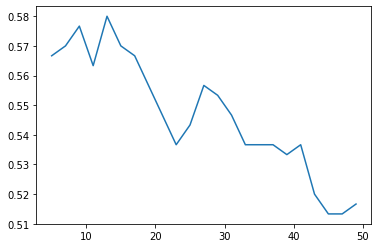

In [ ]:
# KNN
x_k = []
y_acc = []
for k in range(5,50,2):
  knn_model = KNeighborsClassifier(n_neighbors=k)
  knn_model.fit(X_train, y_train)
  preds = knn_model.predict(X_test)
  x_k.append(k)
  y_acc.append(accuracy_score(y_test,preds))

  # print(classification_report(y_test,preds))
plt.plot(x_k,y_acc)

In [ ]:
best = x_k[np.argmax(y_acc)]
print(best)

13


Accuracy KNN : 0.58 



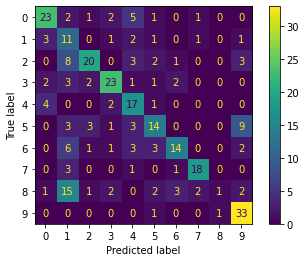

In [ ]:
# KNN
knn_model = KNeighborsClassifier(n_neighbors=best)
knn_model.fit(X_train, y_train)
preds = knn_model.predict(X_test)
print('Accuracy', 'KNN', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

with PCA

In [ ]:
arrx = []
arry = []
arrk = []
for i in range(1,76,3):
    X_temp = df.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    x_k = []
    y_acc = []
    for k in range(5,50,1):
      model = KNeighborsClassifier(n_neighbors=k)
      model.fit(X_temp_train, y_temp_train)
      preds = model.predict(X_temp_test)
      x_k.append(k)
      y_acc.append(accuracy_score(y_temp_test,preds))
    arrx.append(i)
    arrk.append(x_k[np.argmax(y_acc)])
    arry.append(y_acc[np.argmax(y_acc)])

Best number of components 55 , k is 5


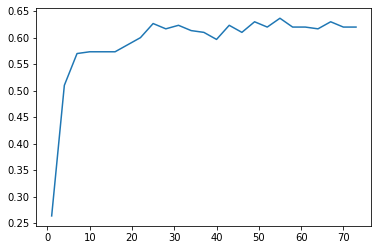

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
bestk = arrk[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)],", k is",arrk[np.argmax(arry)])

Accuracy KNN with PCA : 0.6066666666666667 



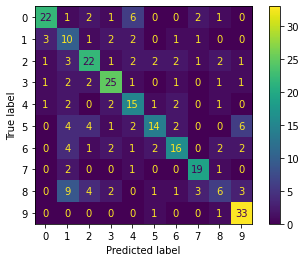

In [ ]:
X_temp = df.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
x_k = []
y_acc = []
model = KNeighborsClassifier(n_neighbors=7)
model.fit(X_temp_train, y_temp_train)
preds = model.predict(X_temp_test)
print('Accuracy', 'KNN with PCA', ':', accuracy_score(y_temp_test, preds), '\n')
DisplayCm(y_test,preds)

**Decision Trees**

without pca

Accuracy Decision Tree : 0.4 



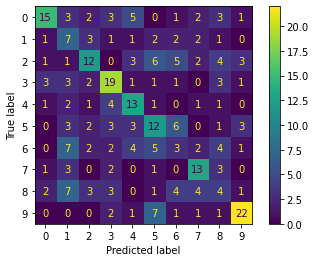

In [ ]:
# Decision trees
decisiontree_model = DecisionTreeClassifier()
decisiontree_model.fit(X_train, y_train)
preds = decisiontree_model.predict(X_test)
print('Accuracy', 'Decision Tree', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

**Plotting image of decision tree**

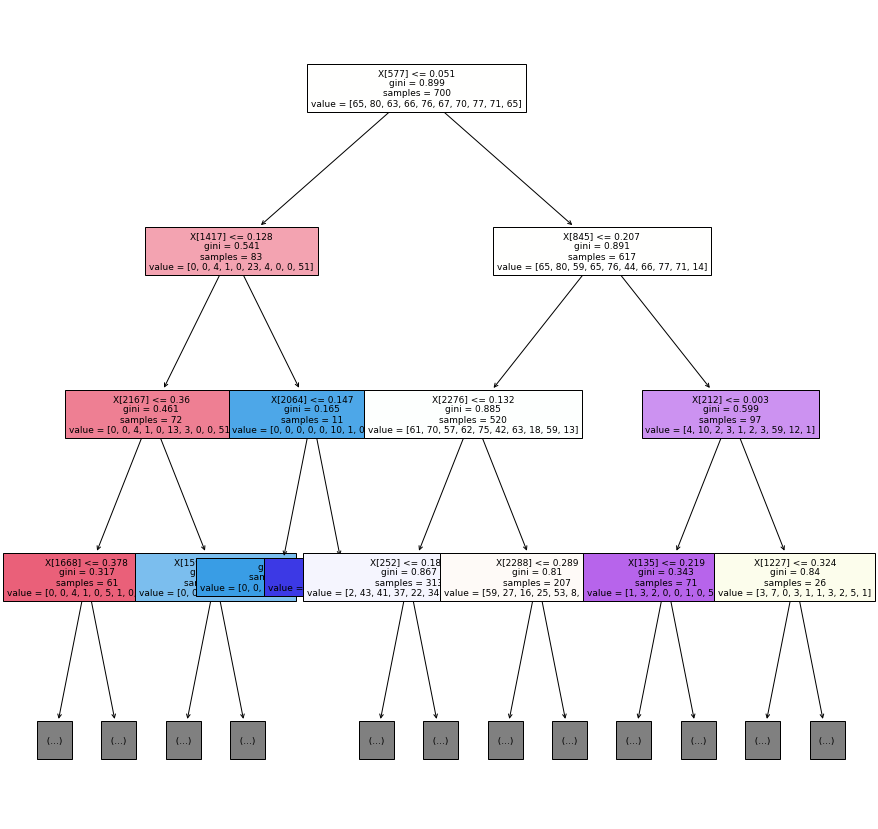

In [ ]:
plt.figure(figsize=(15, 15)) # Resize figure
sklearn.tree.plot_tree(decisiontree_model,max_depth = 3,fontsize = 9, filled=True)
plt.show()

with pca

In [ ]:
arrx = []
arry = []
for i in range(1,76,1):
    X_temp = df.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    model = DecisionTreeClassifier()
    model.fit(X_temp_train, y_temp_train)
    preds = model.predict(X_temp_test)
    arrx.append(i)
    arry.append(accuracy_score(y_temp_test, preds))

Best number of components 24


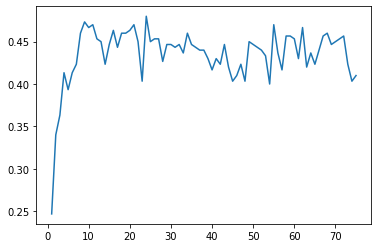

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)])


Accuracy Decision Tree : 0.47 



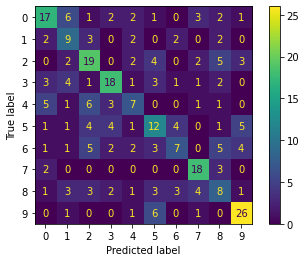

In [ ]:
X_temp = df.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
model = DecisionTreeClassifier()
model.fit(X_temp_train, y_temp_train)
preds = model.predict(X_temp_test)
print('Accuracy', 'Decision Tree', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

**Random Forest**

without pca

Accuracy Random Forest : 0.5733333333333334 



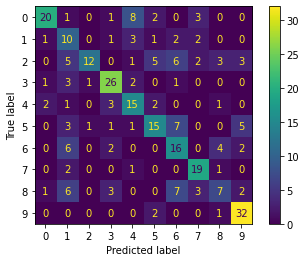

In [ ]:
# Random Forest
randomforest_model = RandomForestClassifier(n_estimators=10000, max_depth=7, random_state=42)
randomforest_model.fit(X_train, y_train)
preds = randomforest_model.predict(X_test)
print('Accuracy', 'Random Forest', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

with pca

In [ ]:
arrx = []
arry = []
for i in range(1,76,15):
    X_temp = df.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    model = RandomForestClassifier(n_estimators=10000, max_depth=7, random_state=42)
    model.fit(X_temp_train, y_temp_train)
    preds = model.predict(X_temp_test)
    arrx.append(i)
    arry.append(accuracy_score(y_temp_test, preds))


Best number of components 61


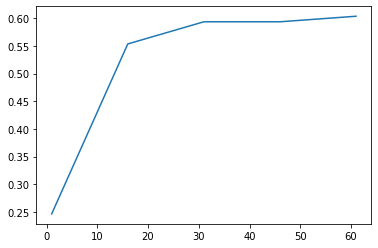

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)])

Accuracy Random Forest after PCA  : 0.61 



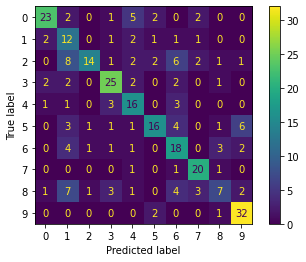

In [ ]:
X_temp = df.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
model = RandomForestClassifier(n_estimators=10000, max_depth=7, random_state=42)
model.fit(X_temp_train, y_temp_train)
preds = model.predict(X_temp_test)
print('Accuracy', 'Random Forest after PCA ', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

**Logistic regreesion**

without pca

Accuracy Logistic Regression : 0.6766666666666666 



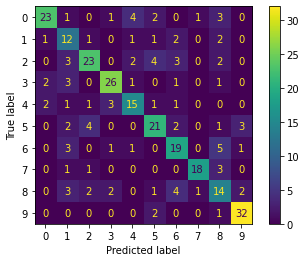

In [ ]:
# Logistic Regression
logistic_model = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial',max_iter = 100000)
logistic_model.fit(X_train, y_train)
preds = logistic_model.predict(X_test)
print('Accuracy', 'Logistic Regression', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

Feature importance

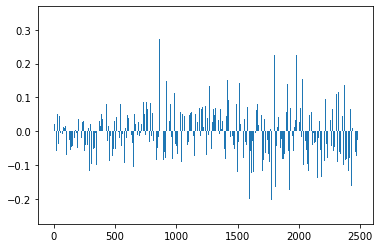

In [ ]:
# Plot
import math
importance = logistic_model.coef_[0]
plt.bar([x for x in range(len(importance))], (importance))
plt.show()

with pca

In [ ]:
arrx = []
arry = []
for i in range(1,76,1):
    X_temp = df.to_numpy()
    min_max_scaler = preprocessing.MinMaxScaler()
    X_temp = min_max_scaler.fit_transform(X_temp)
    pca = PCA(n_components=i)
    X_temp = pca.fit_transform(X_temp)
    X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    model =LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial',max_iter = 100000)
    model.fit(X_temp_train, y_temp_train)
    preds = model.predict(X_temp_test)
    arrx.append(i)
    arry.append(accuracy_score(y_temp_test, preds))

Best number of components 67


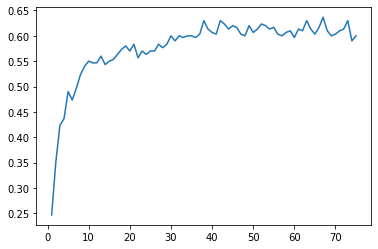

In [ ]:
plt.plot(arrx,arry)
best = arrx[np.argmax(arry)]
print("Best number of components",arrx[np.argmax(arry)])

Accuracy Logistic Regression : 0.6233333333333333 



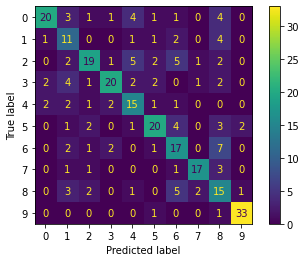

In [ ]:
X_temp = df.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=best)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
model =LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial',max_iter = 100000)
model.fit(X_temp_train, y_temp_train)
preds = model.predict(X_temp_test)
print('Accuracy', 'Logistic Regression', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

**XGBoost**

In [ ]:
xgboost_model = XGBClassifier(n_estimators=1000, learning_rate=0.05)
xgboost_model.fit(X_train, y_train)
preds = xgboost_model.predict(X_test)
print('Accuracy', 'Cross Gradient Boost', ':', accuracy_score(y_test, preds), '\n')

KeyboardInterrupt: ignored

# Recommendation

In [ ]:
# we are using svm_model to recommend as it has the highest accuracy
# first we are classifying the given .wav file by extracting the features

Accuracy SVM : 0.7266666666666667 



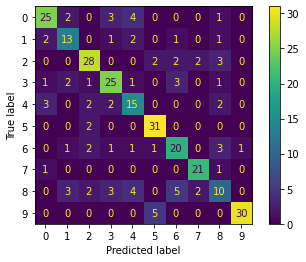

In [ ]:
X_temp = DF.to_numpy()
min_max_scaler = preprocessing.MinMaxScaler()
X_temp = min_max_scaler.fit_transform(X_temp)
pca = PCA(n_components=53)
X_temp = pca.fit_transform(X_temp)
X_temp_train, X_temp_test, y_temp_train, y_temp_test = train_test_split(X_temp, y, test_size=0.3, random_state=42)
svm_model = SVC(decision_function_shape="ovo")
svm_model.fit(X_temp_train, y_temp_train)
preds = svm_model.predict(X_temp_test)
print('Accuracy', 'SVM', ':', accuracy_score(y_test, preds), '\n')
DisplayCm(y_test,preds)

In [ ]:
new_data_path = '/content/drive/MyDrive/recommendsongs'
# audio_time_series, sr = librosa.load(f'{new_data_path}/blues.wav')
audio_time_series, sr = librosa.load(f'{data_path}/genres_original/hiphop/hiphop.00010.wav')
mfcc = librosa.feature.mfcc(audio_time_series, sr=sr)
hop_length = 5000
chromagram = librosa.feature.chroma_stft(audio_time_series, sr=sr, hop_length=hop_length)
spectral_centroids = librosa.feature.spectral_centroid(audio_time_series, sr=sr)
spectral_rolloff = librosa.feature.spectral_rolloff(audio_time_series, sr=sr)
tempo, _ = librosa.beat.beat_track(audio_time_series, sr = sr)
zcr = librosa.feature.zero_crossing_rate(audio_time_series)
onset_env = librosa.onset.onset_strength(y=audio_time_series, sr=sr)
pitches, magnitudes = librosa.piptrack(y=audio_time_series, sr=sr)
flst = [mfcc.mean(1),mfcc.var(1),chromagram.mean(1),chromagram.var(1),spectral_centroids.mean(1),spectral_centroids.var(1),spectral_rolloff.mean(1),spectral_rolloff.var(1),tempo,zcr.mean(1)[0],zcr.var(1)[0],onset_env.mean(0),onset_env.var(0),pitches.mean(1).mean(0),pitches.var(1).var(0)]
features = np.array([])
for f in flst:
  features = np.append(features,f)


In [ ]:
min_max_scaler_t = preprocessing.MinMaxScaler()
min_max_scaler_t = min_max_scaler_t.fit(DF.to_numpy())

In [ ]:
# newX = min_max_scaler_t.transform(np.array([features]))
# newX = np.array([features])
X_t = DF.to_numpy()
pca_t = PCA(n_components=53)
min_max_scaler = preprocessing.MinMaxScaler()
min_max_scaler.fit(X_t)
X_t = min_max_scaler.transform(X_t)
pca_t.fit(X_t)
print(pca_t.transform(X_t)[0])

[ 0.50327363 -0.24353264  0.13735656 -0.11118426  0.02134351  0.07806033
  0.05980362 -0.16089532  0.02739312 -0.06000657 -0.0270369  -0.05325174
 -0.05640149 -0.07920673 -0.07005973 -0.19271146 -0.02036807  0.05233222
 -0.04496222  0.04007011 -0.10029521 -0.03117655 -0.09285468  0.11926564
  0.03570081  0.0743906   0.03662788  0.12329783 -0.13079956  0.09182419
  0.10285576  0.04550577  0.05477516  0.02232263  0.02591428 -0.007504
 -0.018927   -0.04145441  0.04865958 -0.03784877 -0.02375998 -0.0068649
  0.02804636 -0.06344651  0.00166663  0.02069208 -0.03909889 -0.043425
  0.03199086  0.01973039 -0.06011371 -0.00287437 -0.0062007 ]


In [ ]:
X_t = DF.to_numpy()

scaled = min_max_scaler.transform(np.array([features]))
newX = pca_t.transform(scaled)
print(pca_t.transform(scaled))

[[ 0.5032736  -0.24353264  0.13735652 -0.11118433  0.0213436   0.07806025
   0.05980357 -0.16089535  0.02739313 -0.06000656 -0.02703684 -0.0532517
  -0.0564015  -0.07920679 -0.07005972 -0.19271147 -0.02036806  0.05233223
  -0.04496226  0.04007006 -0.10029518 -0.03117654 -0.09285476  0.11926566
   0.03570083  0.07439059  0.03662784  0.12329781 -0.13079959  0.09182417
   0.10285567  0.04550577  0.05477515  0.02232262  0.02591433 -0.00750404
  -0.01892704 -0.04145438  0.0486596  -0.03784873 -0.02376004 -0.00686489
   0.02804635 -0.06344647  0.00166666  0.02069212 -0.03909888 -0.04342496
   0.03199085  0.01973036 -0.06011368 -0.00287435 -0.00620069]]


In [ ]:
import os
import time
import IPython.display as ipd
import random
# new_features = np.matmul(U,newX[0])
# f = np.array([new_features])
genres = ['hiphop', 'disco', 'blues', 'pop', 'reggae', 'jazz', 'country', 'metal', 'rock', 'classical']
predict = genres[svm_model.predict(newX)[0]]
# print(svm_model.predict(X[0]))
dir = (f'{data_path}/genres_original/{predict}')
lst_audio = []
l_files = os.listdir(dir)
random.shuffle(l_files)
count = 0
for files in l_files:
  count = count + 1
  if(count > 5):
    break
  file_path = f'{dir}/{files}'
  audio_time_series, sr = librosa.load(file_path)
  lst_audio.append(file_path)

In [ ]:
ipd.Audio(lst_audio[0])

In [ ]:
ipd.Audio(lst_audio[1])

In [ ]:
ipd.Audio(lst_audio[2])

In [ ]:
ipd.Audio(lst_audio[3])

In [ ]:
ipd.Audio(lst_audio[4])